In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import muon as mu
from muon import prot as pt
from muon import rna as rna
import os
from mudata import MuData
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/si

In [2]:
sc.set_figure_params(frameon=False, figsize=(4, 4))

In [3]:
mdata = mu.read('/Users/anasuyadighe/Downloads/20230616_GAP-hashed-persamplenorm-iter2.h5mu')

In [4]:
mdata

MuData object with n_obs × n_vars = 60263 × 19086
  var:	'gene_ids', 'feature_types', 'genome'
  2 modalities
    rna:	57471 x 19059
      obs:	'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'hashing', 'leiden'
      var:	'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
      uns:	'hashing_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
      obsm:	'X_pca', 'X_umap', 'hash_onoff'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    prot:	60263 x 27
      obs:	'sample'
      var:	'gene_ids', 'feature_types', 'genome'
      uns:	'neighbors', 'pca', 'sample_colors', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [5]:
rna = mdata.mod['rna']

In [6]:
rna.obs['sample']

AAACAAGCATGGATTG-1-P1-TD-d8      P1-TD-d8
AAACCAATCTAATTGC-1-P1-TD-d8      P1-TD-d8
AAACCAGGTCATGAAG-1-P1-TD-d8      P1-TD-d8
AAACGGGCAAGTTAAC-1-P1-TD-d8      P1-TD-d8
AAACGGGCAGAAAGGT-1-P1-TD-d8      P1-TD-d8
                                  ...    
TTTGTGAGTTAATTCG-1-P6-T4-d15    P6-T4-d15
TTTGTGAGTTCAAGGA-1-P6-T4-d15    P6-T4-d15
TTTGTGAGTTGCGGCT-1-P6-T4-d15    P6-T4-d15
TTTGTGAGTTGGCGAG-1-P6-T4-d15    P6-T4-d15
TTTGTGAGTTTAACCA-1-P6-T4-d15    P6-T4-d15
Name: sample, Length: 57471, dtype: category
Categories (6, object): ['P1-TD-d8', 'P2-T1-d8', 'P3-TD-d12', 'P4-T2-d12', 'P5-T0-d15', 'P6-T4-d15']

In [7]:
samples_to_keep = ~rna.obs['sample'].isin(['P5-T0-d15','P6-T4-d15'])

In [8]:
filtered_adata = rna[samples_to_keep].copy()

In [9]:
filtered_adata

AnnData object with n_obs × n_vars = 35900 × 19059
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'hashing', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hashing_colors', 'leiden', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'hash_onoff'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [10]:
prot = mdata.mod['prot']

In [11]:
rna_sing = filtered_adata[filtered_adata.obs['hashing'].str.contains('1.0')]
prot_sing = prot[rna_sing.obs_names]

In [12]:
rna_sing

View of AnnData object with n_obs × n_vars = 15699 × 19059
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'hashing', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hashing_colors', 'leiden', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'hash_onoff'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [13]:
prot_sing

View of AnnData object with n_obs × n_vars = 15699 × 27
    obs: 'sample'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [14]:
hash_data = prot[:, :6].copy().to_df()
hash_data['sample'] = prot.obs['sample']

In [15]:
hash_data

,Hashtag1_TotalSeqB,Hashtag2_TotalSeqB,Hashtag3_TotalSeqB,Hashtag4_TotalSeqB,Hashtag5_TotalSeqB,Hashtag6_TotalSeqB,sample
AAACAAGCATGGATTG-1-P1-TD-d8,13.623221,7.367730,4.323073,3.718673,9.155756,4.191432,P1-TD-d8
AAACCAATCTAATTGC-1-P1-TD-d8,4.122584,3.483558,9.203765,3.513347,4.738729,12.768611,P1-TD-d8
AAACCAGGTCATGAAG-1-P1-TD-d8,2.812624,4.054366,4.094949,3.640638,2.683031,11.941731,P1-TD-d8
AAACGGGCAAGTTAAC-1-P1-TD-d8,2.497146,4.825302,2.330774,8.999466,10.782969,9.563780,P1-TD-d8
AAACGGGCAGAAAGGT-1-P1-TD-d8,3.334355,2.571099,7.182946,5.227791,3.073711,2.729862,P1-TD-d8
...,...,...,...,...,...,...,...
TTTGTGAGTTAATTCG-1-P6-T4-d15,5.902713,26.459734,8.151190,9.294083,0.992473,1.001785,P6-T4-d15
TTTGTGAGTTCAAGGA-1-P6-T4-d15,4.188711,11.669479,18.137760,11.315475,0.976202,0.972871,P6-T4-d15
TTTGTGAGTTGCGGCT-1-P6-T4-d15,5.196664,9.609532,15.567600,42.107780,0.994170,1.004801,P6-T4-d15
TTTGTGAGTTGGCGAG-1-P6-T4-d15,7.664575,26.699080,5.410088,8.677883,0.999444,1.014172,P6-T4-d15


In [16]:
# Filter the DataFrame to include only the specified samples
hash_data_filtered = hash_data[hash_data['sample'].isin(['P1-TD-d8', 'P2-T1-d8', 'P3-TD-d12', 'P4-T2-d12'])]

In [17]:
# Display the filtered DataFrame
hash_data_filtered

,Hashtag1_TotalSeqB,Hashtag2_TotalSeqB,Hashtag3_TotalSeqB,Hashtag4_TotalSeqB,Hashtag5_TotalSeqB,Hashtag6_TotalSeqB,sample
AAACAAGCATGGATTG-1-P1-TD-d8,13.623221,7.367730,4.323073,3.718673,9.155756,4.191432,P1-TD-d8
AAACCAATCTAATTGC-1-P1-TD-d8,4.122584,3.483558,9.203765,3.513347,4.738729,12.768611,P1-TD-d8
AAACCAGGTCATGAAG-1-P1-TD-d8,2.812624,4.054366,4.094949,3.640638,2.683031,11.941731,P1-TD-d8
AAACGGGCAAGTTAAC-1-P1-TD-d8,2.497146,4.825302,2.330774,8.999466,10.782969,9.563780,P1-TD-d8
AAACGGGCAGAAAGGT-1-P1-TD-d8,3.334355,2.571099,7.182946,5.227791,3.073711,2.729862,P1-TD-d8
...,...,...,...,...,...,...,...
TTTGTGAGTGCGATAA-1-P4-T2-d12,1.926381,1.870453,0.927434,0.789234,1.285746,1.818278,P4-T2-d12
TTTGTGAGTGTGGCTC-1-P4-T2-d12,7.352105,5.858860,0.534435,0.561512,5.578093,9.214191,P4-T2-d12
TTTGTGAGTTAATCCA-1-P4-T2-d12,7.884217,4.377846,0.658314,0.633293,8.246326,3.112559,P4-T2-d12
TTTGTGAGTTAGGCTT-1-P4-T2-d12,1.896120,1.427208,0.923896,0.787184,3.215483,1.783898,P4-T2-d12


In [18]:
sc.tl.leiden(filtered_adata)
hash_data_filtered = hash_data_filtered.loc[filtered_adata.obs_names.values]
hash_data_filtered['leiden'] = filtered_adata.obs['leiden']

In [20]:
hash_data_filtered

,Hashtag1_TotalSeqB,Hashtag2_TotalSeqB,Hashtag3_TotalSeqB,Hashtag4_TotalSeqB,Hashtag5_TotalSeqB,Hashtag6_TotalSeqB,sample,leiden
AAACAAGCATGGATTG-1-P1-TD-d8,13.623221,7.367730,4.323073,3.718673,9.155756,4.191432,P1-TD-d8,9
AAACCAATCTAATTGC-1-P1-TD-d8,4.122584,3.483558,9.203765,3.513347,4.738729,12.768611,P1-TD-d8,1
AAACCAGGTCATGAAG-1-P1-TD-d8,2.812624,4.054366,4.094949,3.640638,2.683031,11.941731,P1-TD-d8,13
AAACGGGCAAGTTAAC-1-P1-TD-d8,2.497146,4.825302,2.330774,8.999466,10.782969,9.563780,P1-TD-d8,4
AAACGGGCAGAAAGGT-1-P1-TD-d8,3.334355,2.571099,7.182946,5.227791,3.073711,2.729862,P1-TD-d8,5
...,...,...,...,...,...,...,...,...
TTTGTGAGTGCGATAA-1-P4-T2-d12,1.926381,1.870453,0.927434,0.789234,1.285746,1.818278,P4-T2-d12,6
TTTGTGAGTGTGGCTC-1-P4-T2-d12,7.352105,5.858860,0.534435,0.561512,5.578093,9.214191,P4-T2-d12,2
TTTGTGAGTTAATCCA-1-P4-T2-d12,7.884217,4.377846,0.658314,0.633293,8.246326,3.112559,P4-T2-d12,2
TTTGTGAGTTAGGCTT-1-P4-T2-d12,1.896120,1.427208,0.923896,0.787184,3.215483,1.783898,P4-T2-d12,8


/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna

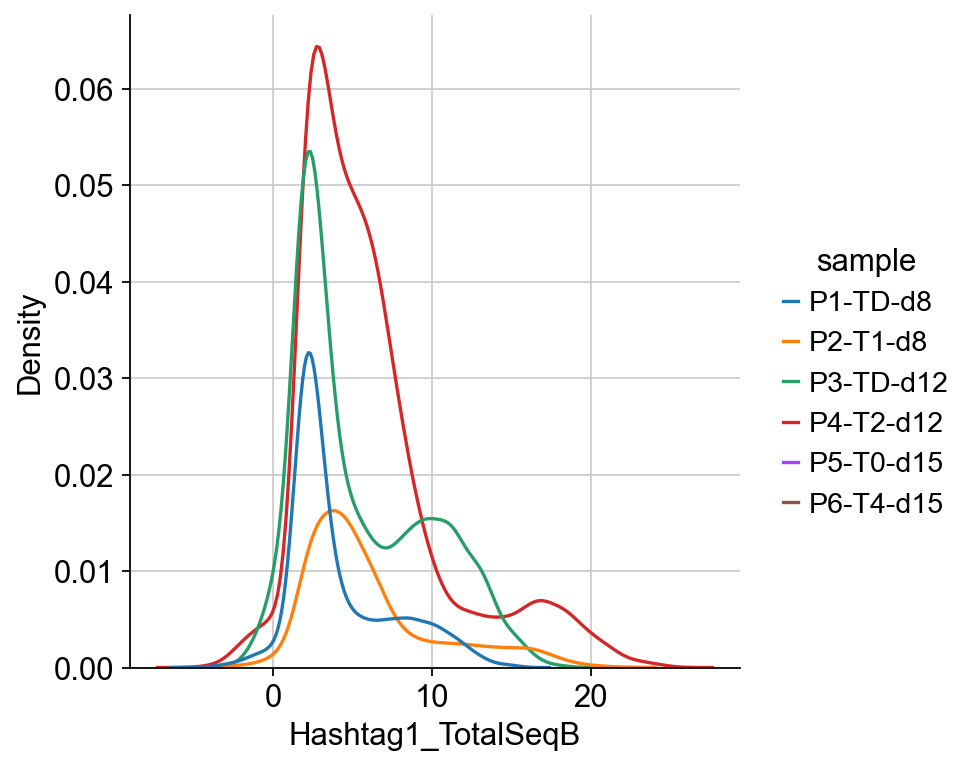

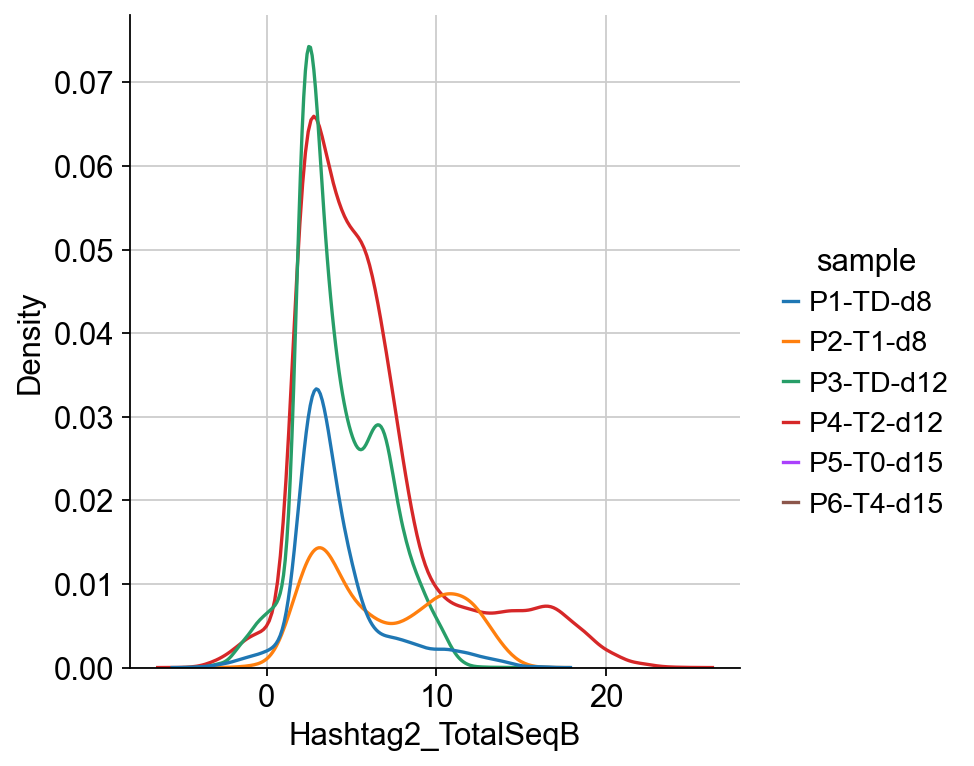

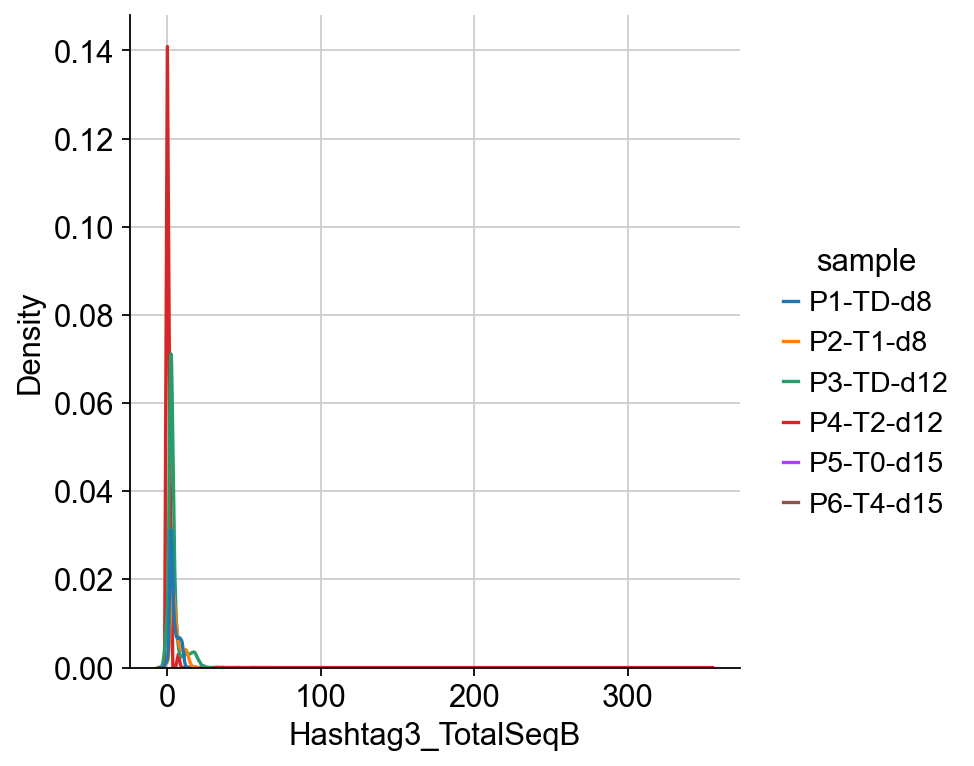

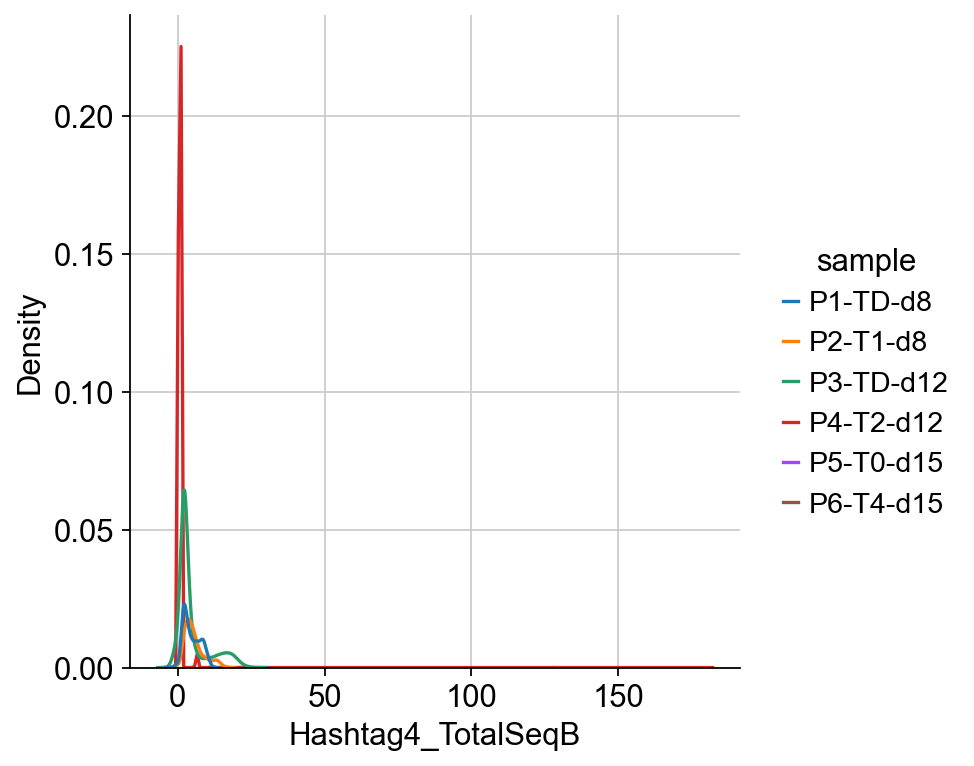

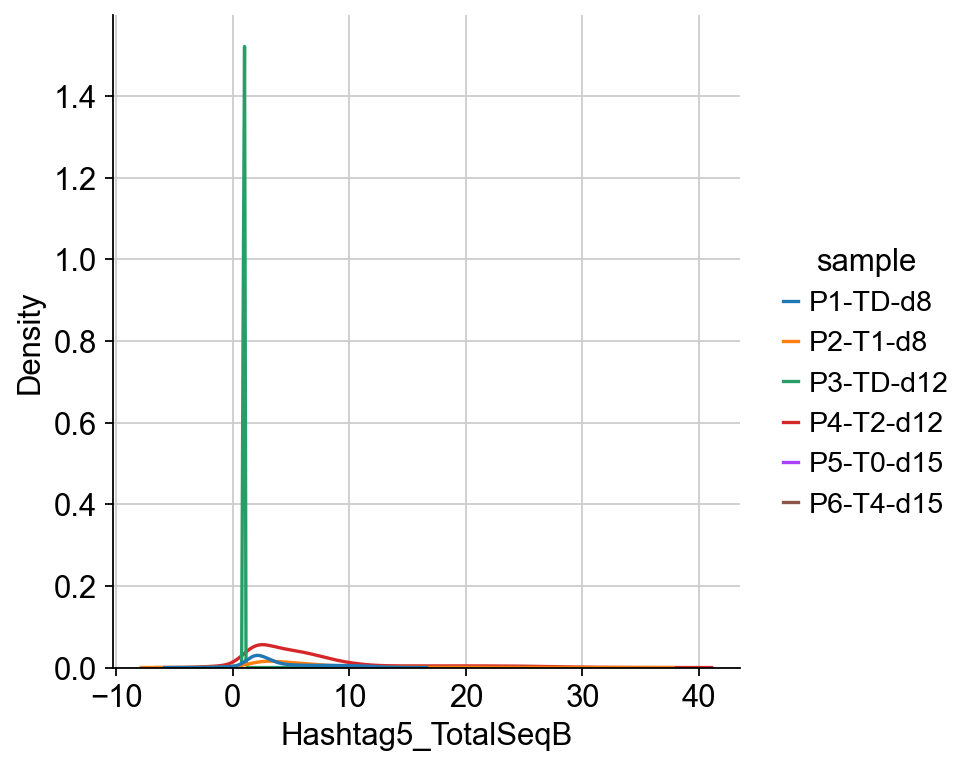

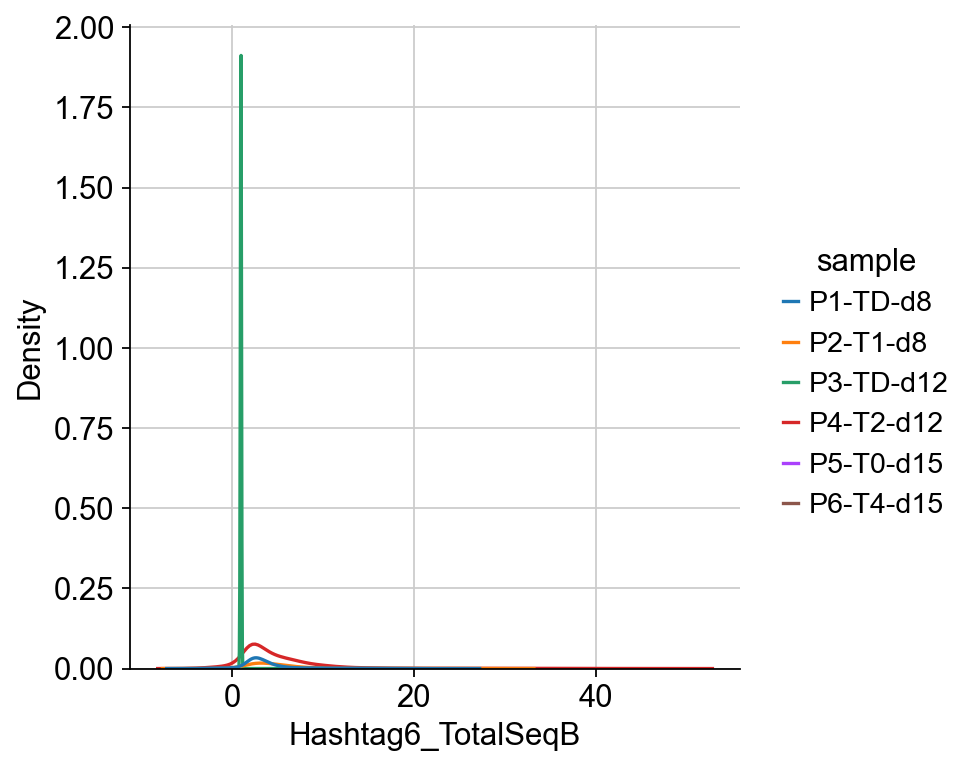

In [19]:
sns.displot(data=hash_data_filtered, x="Hashtag1_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data_filtered, x="Hashtag2_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data_filtered, x="Hashtag3_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data_filtered, x="Hashtag4_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data_filtered, x="Hashtag5_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data_filtered, x="Hashtag6_TotalSeqB", hue="sample", kind="kde")

In [21]:
hash_onoff = np.zeros((hash_data_filtered.shape[0], hash_data_filtered.shape[1] - 2))

In [22]:
hash_dict = {'P1-TD-d8': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB'],
             'P2-T1-d8': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB'],
             'P3-TD-d12': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB'],
             'P4-T2-d12': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB']
             }

In [23]:
hashtag_dict = {0: 'Hash 1',
                1: 'Hash 2',
                2: 'Hash 3',
                3: 'Hash 4',
                4: 'Hash 5',
                5: 'Hash 6'}

In [24]:
rna_sing.obs['hashtag'] = np.argmax(hash_onoff[np.where(filtered_adata.obs['hashing'].str.contains('1.0'))], axis=1)
rna_sing.obs['hashtag'] = rna_sing.obs['hashtag'].map(hashtag_dict)
prot_sing.obs['hashtag'] = rna_sing.obs['hashtag']

/var/folders/wb/0twtb9pj5rq2sw71djs3j1z00000gn/T/ipykernel_25234/3759730684.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rna_sing.obs['hashtag'] = np.argmax(hash_onoff[np.where(filtered_adata.obs['hashing'].str.contains('1.0'))], axis=1)
/var/folders/wb/0twtb9pj5rq2sw71djs3j1z00000gn/T/ipykernel_25234/3759730684.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  prot_sing.obs['hashtag'] = rna_sing.obs['hashtag']


In [25]:
mdata_sing = MuData({"rna": rna_sing, "prot": prot_sing})

In [26]:
sc.tl.pca(rna_sing, svd_solver='arpack')

In [27]:
sc.pp.neighbors(rna_sing, n_neighbors=15, n_pcs=50)

In [28]:
sc.tl.umap(rna_sing)
leiden_map = {'0': 'CD45-', '1': 'CD45+'}
rna_sing.obs['CD45'] = rna_sing.obs['leiden'].map(leiden_map)

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


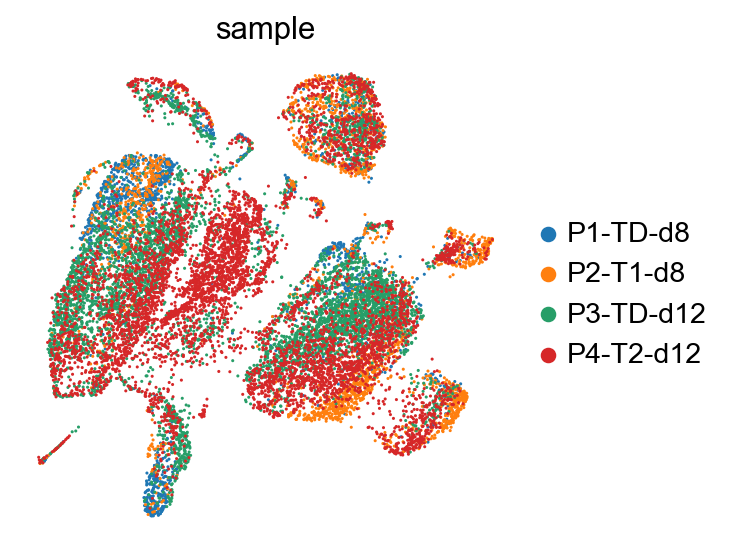

In [29]:
sc.pl.umap(rna_sing, color='sample')

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


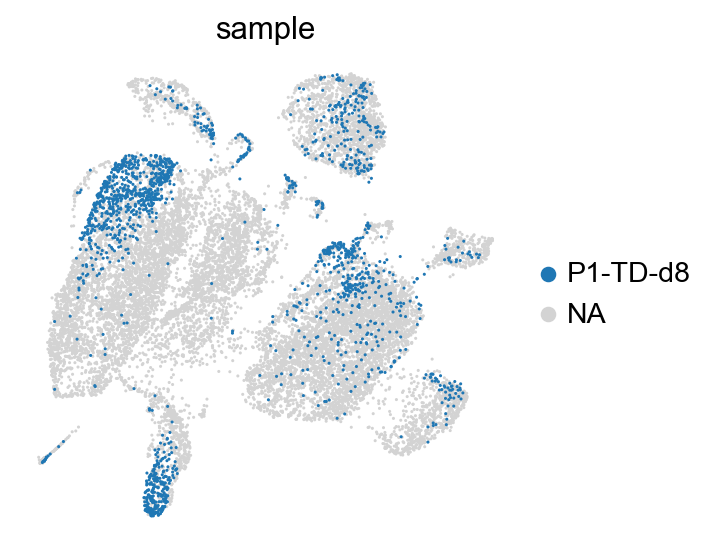

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


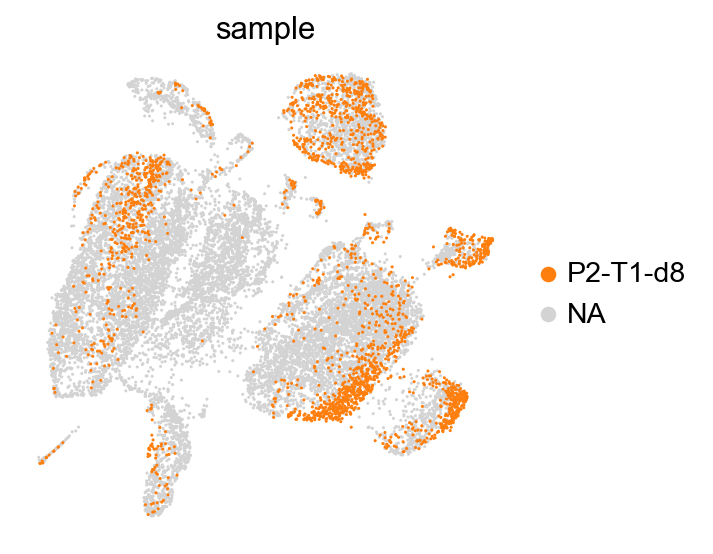

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


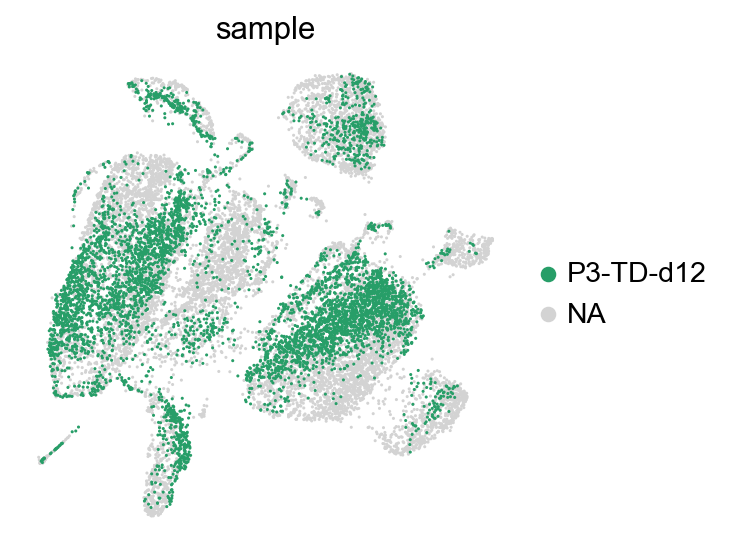

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


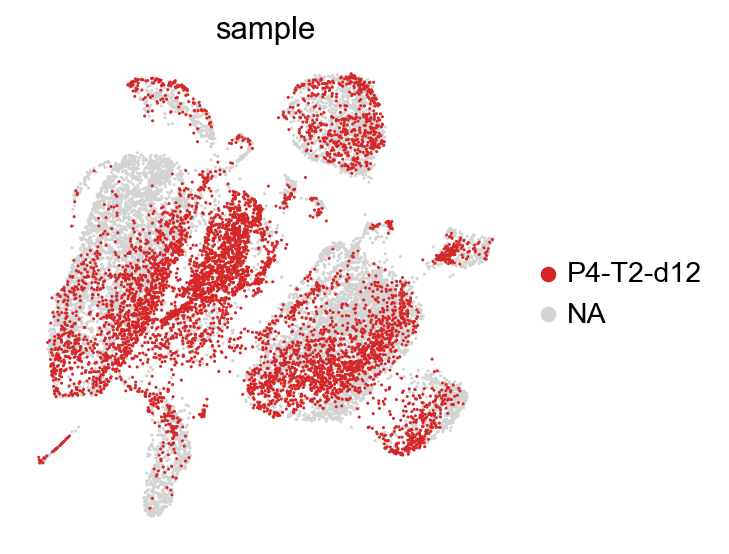

In [31]:
sc.pl.umap(rna_sing, color='sample', groups=['P1-TD-d8'])
sc.pl.umap(rna_sing, color='sample', groups=['P2-T1-d8'])
sc.pl.umap(rna_sing, color='sample', groups=['P3-TD-d12'])
sc.pl.umap(rna_sing, color='sample', groups=['P4-T2-d12'])


/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


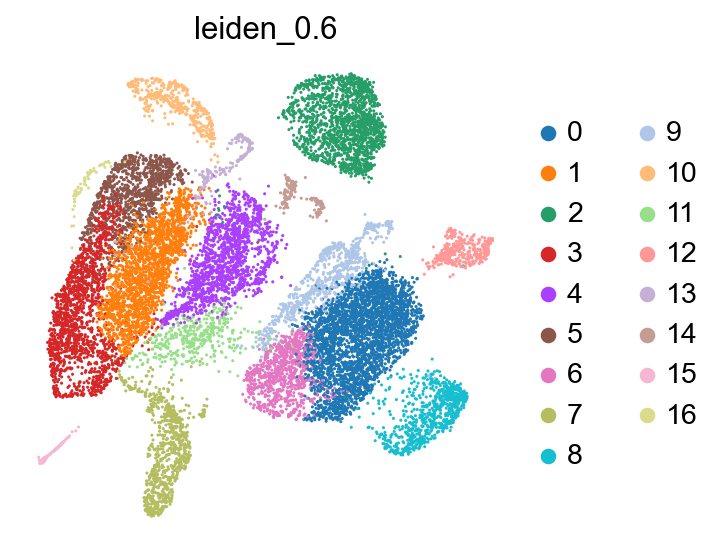

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


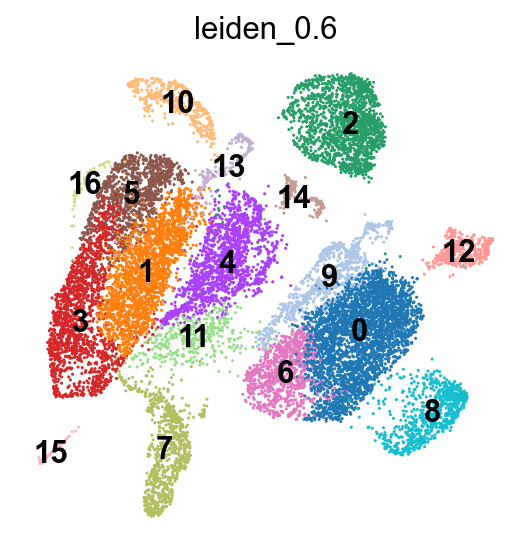

In [35]:
sc.tl.leiden(rna_sing, resolution = 0.6, key_added = 'leiden_0.6')
sc.pl.umap(rna_sing, color = 'leiden_0.6')
sc.pl.umap(rna_sing, color = 'leiden_0.6', legend_loc='on data')

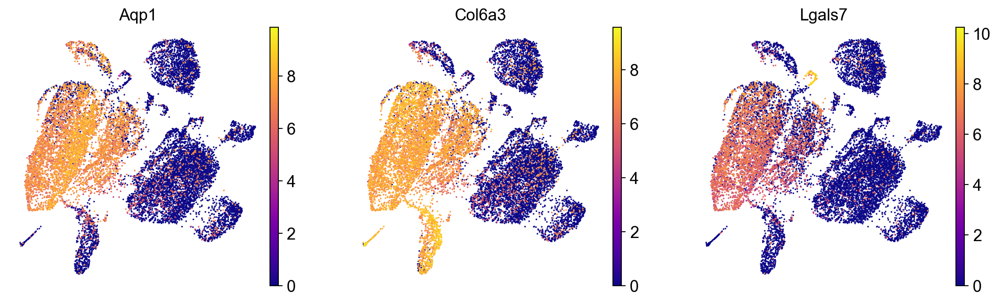

In [53]:
sc.pl.umap(rna_sing, color = ['Aqp1','Col6a3','Lgals7'], cmap='plasma')

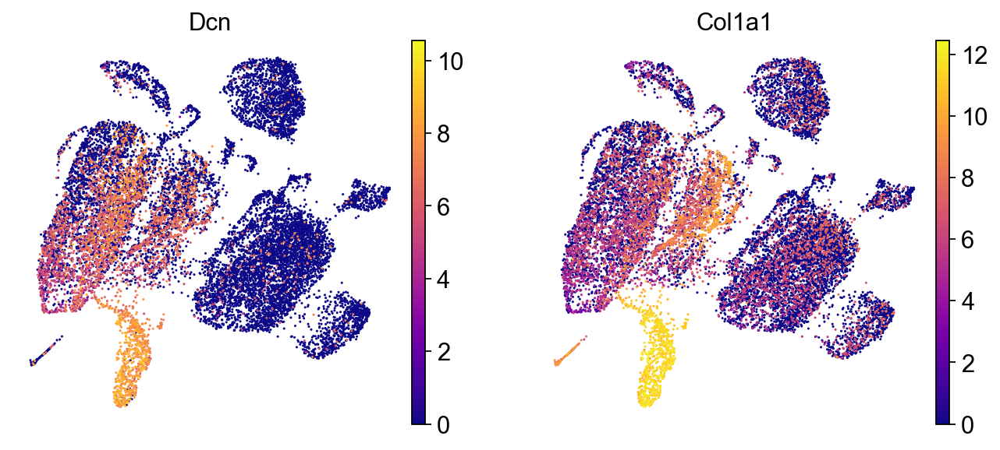

In [54]:
sc.pl.umap(rna_sing, color = ['Dcn','Col1a1'], cmap='plasma')

In [55]:
mdata_sing

MuData object with n_obs × n_vars = 15699 × 19086
  var:	'gene_ids', 'feature_types', 'genome'
  2 modalities
    rna:	15699 x 19059
      obs:	'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'hashing', 'leiden', 'hashtag', 'CD45', 'leiden_0.6'
      var:	'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
      uns:	'hashing_colors', 'leiden', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap', 'leiden_0.6_colors'
      obsm:	'X_pca', 'X_umap', 'hash_onoff'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    prot:	15699 x 27
      obs:	'sample', 'hashtag'
      var:	'gene_ids', 'feature_types', 'genome'
      uns:	'neighbors', 'pca', 'sample_colors', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

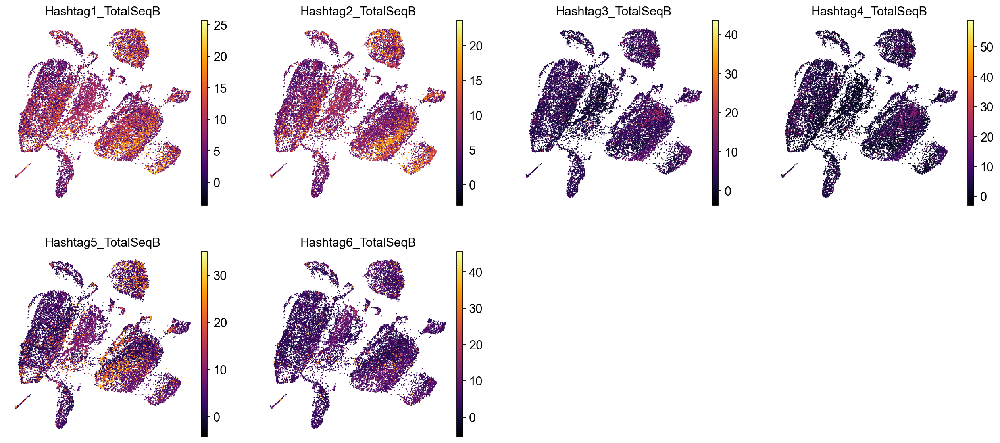

In [56]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color=["Hashtag1_TotalSeqB","Hashtag2_TotalSeqB",
                       "Hashtag3_TotalSeqB","Hashtag4_TotalSeqB",
                      "Hashtag5_TotalSeqB","Hashtag6_TotalSeqB"])

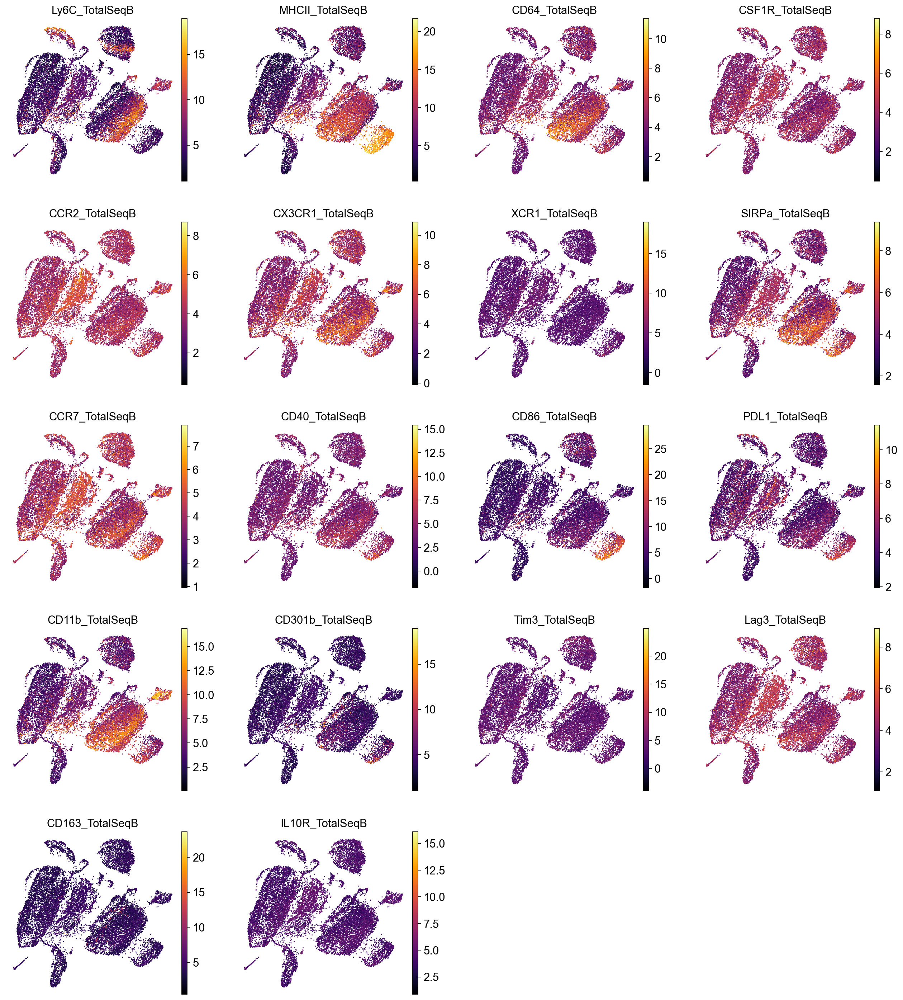

In [57]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color=["Ly6C_TotalSeqB","MHCII_TotalSeqB",
                        "CD64_TotalSeqB","CSF1R_TotalSeqB",
                        "CCR2_TotalSeqB","CX3CR1_TotalSeqB",
                       "XCR1_TotalSeqB","SIRPa_TotalSeqB",
                       "CCR7_TotalSeqB","CD40_TotalSeqB",
                        "CD86_TotalSeqB","PDL1_TotalSeqB",
                       "CD11b_TotalSeqB","CD301b_TotalSeqB",
                        "Tim3_TotalSeqB","Lag3_TotalSeqB",
                       "CD163_TotalSeqB","IL10R_TotalSeqB"])

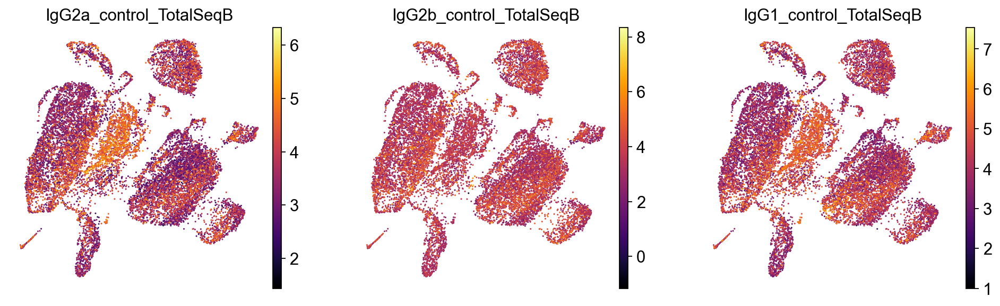

In [58]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color=["IgG2a_control_TotalSeqB","IgG2b_control_TotalSeqB","IgG1_control_TotalSeqB"])

In [61]:
day8_unt_samples_to_keep = ~rna_sing.obs['sample'].isin(['P2-T1-d8', 'P3-TD-d12', 'P4-T2-d12'])

In [62]:
day8_unt = rna_sing[day8_unt_samples_to_keep].copy()

In [65]:
day8_unt.raw = day8_unt

In [67]:
day8_unt  = day8_unt.raw.to_adata()

In [68]:
!mkdir matrix_files

In [69]:
day8_unt.obs_names

Index(['AAACCAGGTCATGAAG-1-P1-TD-d8', 'AAACGGGCAGTTATGG-1-P1-TD-d8',
       'AAACTGGGTATTCGAC-1-P1-TD-d8', 'AAACTGGGTGCACTAT-1-P1-TD-d8',
       'AAACTGGGTTACTCCC-1-P1-TD-d8', 'AAACTGTCACAACATG-1-P1-TD-d8',
       'AAACTGTCAGCTCGCT-1-P1-TD-d8', 'AAAGATGCAAGAACAA-1-P1-TD-d8',
       'AAAGCATGTTGGATGA-1-P1-TD-d8', 'AAAGCCTAGTTTGCAT-1-P1-TD-d8',
       ...
       'TTTCAAGGTGTGAGGT-1-P1-TD-d8', 'TTTCACCTCAGGGATT-1-P1-TD-d8',
       'TTTCACCTCCAACTAT-1-P1-TD-d8', 'TTTCAGTAGGTAATTG-1-P1-TD-d8',
       'TTTCATGCAGAATCGC-1-P1-TD-d8', 'TTTCGCGCAAATACCG-1-P1-TD-d8',
       'TTTGAGAAGTAACTTC-1-P1-TD-d8', 'TTTGAGAAGTCTATGT-1-P1-TD-d8',
       'TTTGGACGTAGCCATT-1-P1-TD-d8', 'TTTGTGAGTTTGGCCA-1-P1-TD-d8'],
      dtype='object', length=1753)

In [70]:
with open('matrix_files/barcodes.tsv','w') as f:
    for item in day8_unt.obs_names:
        f.write(item + '\n')

In [71]:
with open('matrix_files/features.tsv','w') as f:
    for item in ['\t'.join([x,x,'Gene Expression']) for x in day8_unt.var_names]:
        f.write(item + '\n')

In [73]:
from scipy.io import mmwrite

# Assuming 'day8_unt.X.T' is the matrix you want to write
mmwrite('matrix_files/matrix', day8_unt.X.T)
#io.mmwrite('matrix_files/matrix', day8_unt.X.T)

In [78]:
!ls matrix_files/

barcodes.tsv.gz features.tsv.gz matrix.mtx.gz


In [75]:
!gzip matrix_files/*

In [79]:
day8_unt.obs.to_csv('metadata.csv')

In [80]:
day8_unt.obs

,sample,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_counts,hashing,leiden,hashtag,CD45,leiden_0.6
AAACCAGGTCATGAAG-1-P1-TD-d8,P1-TD-d8,894,1619.0,5.0,0.308833,1619.0,1.0,1,Hash 1,CD45+,9
AAACGGGCAGTTATGG-1-P1-TD-d8,P1-TD-d8,1025,1729.0,25.0,1.445922,1729.0,1.0,0,Hash 1,CD45-,7
AAACTGGGTATTCGAC-1-P1-TD-d8,P1-TD-d8,573,796.0,2.0,0.251256,796.0,1.0,1,Hash 1,CD45+,0
AAACTGGGTGCACTAT-1-P1-TD-d8,P1-TD-d8,1033,1870.0,26.0,1.390374,1870.0,1.0,0,Hash 1,CD45-,7
AAACTGGGTTACTCCC-1-P1-TD-d8,P1-TD-d8,1136,1590.0,8.0,0.503145,1590.0,1.0,0,Hash 1,CD45-,5
...,...,...,...,...,...,...,...,...,...,...,...
TTTCGCGCAAATACCG-1-P1-TD-d8,P1-TD-d8,1972,3822.0,45.0,1.177394,3822.0,1.0,0,Hash 1,CD45-,5
TTTGAGAAGTAACTTC-1-P1-TD-d8,P1-TD-d8,565,689.0,8.0,1.161103,689.0,1.0,0,Hash 1,CD45-,5
TTTGAGAAGTCTATGT-1-P1-TD-d8,P1-TD-d8,1053,1568.0,21.0,1.339286,1568.0,1.0,0,Hash 1,CD45-,14
TTTGGACGTAGCCATT-1-P1-TD-d8,P1-TD-d8,1043,1644.0,16.0,0.973236,1644.0,1.0,0,Hash 1,CD45-,5


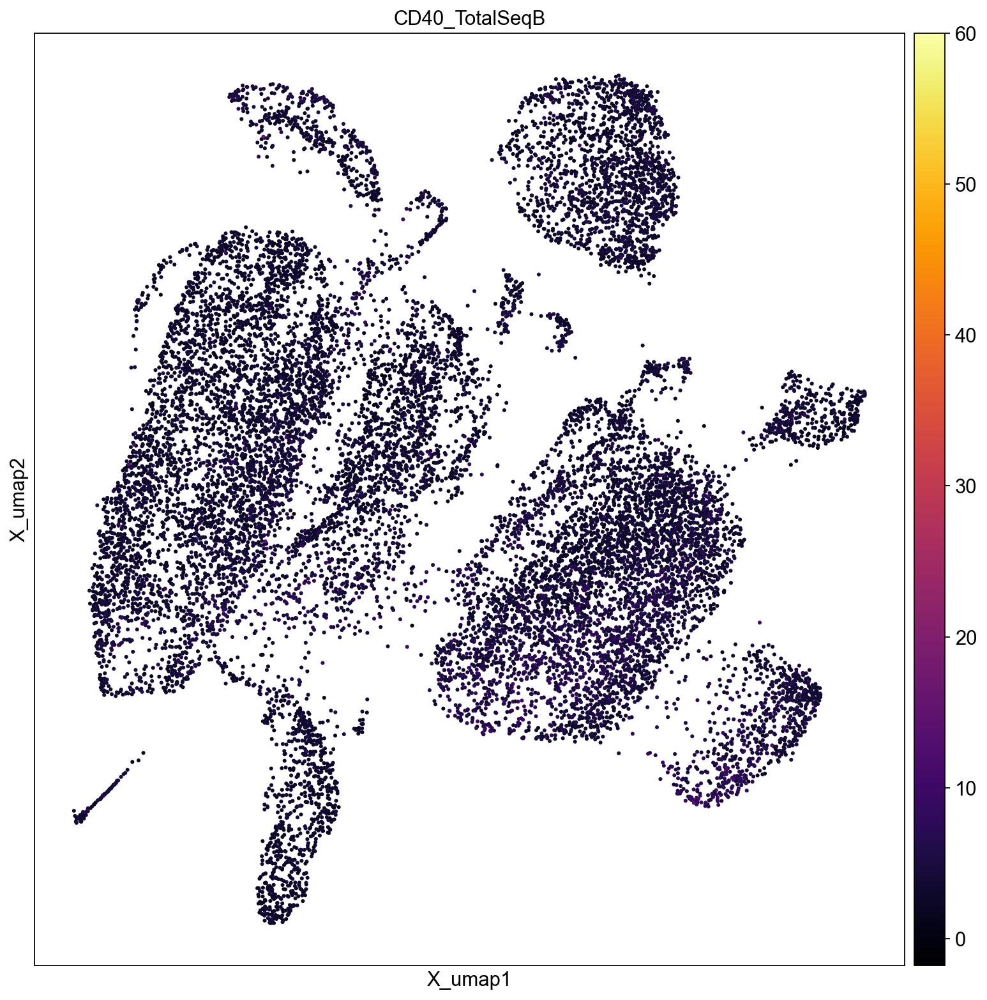

In [98]:

#sc.pl.umap(pbmc, color="LGALS2", cmap=reds, vmin=0.00001)
mu.pl.embedding(mdata_sing, basis="rna:X_umap",  color="CD40_TotalSeqB", vmax = 60, cmap='inferno', s = 30)
               